<span style="color: #03FFFF; font-family: Times New Roman; font-size: 2em;"> Diffusion Interventions ᕙ(‾̀◡‾́)ᕗ </span><br>
Diffusion Interventions to invetigate self- and cross-attentions at different layers.

In [1]:
%cd ..
from main import load, run
from interventions.ablate import AblationIntervention
from interventions.encoder import EncoderIntervention
from interventions.scale import ScalingIntervention
from util import encode_prompt
import matplotlib.pyplot as plt
import numpy as np

/share/u/imgr/nnsight-folder/collaborative_diffusion


In [2]:
model = load()
model._model.pipeline.safety_checker = None

Keyword arguments {'trust_remote_code': True} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

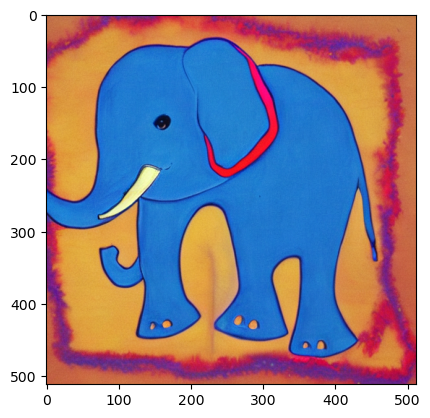

In [3]:
image = run(model, prompt="blue elephant", seed=40)
plt.imshow(image)

In [5]:
#LAYER PATHS IN THE RIGHT ORDER

my_self_layers =[
    '.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn1', #1
    '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn1', #2
    '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn1', #3
    '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn1', #4
    '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn1', #5
    '.unet.down_blocks.2.attentions.1.transformer_blocks.0.attn1', #6
    '.unet.mid_block.attentions.0.transformer_blocks.0.attn1', #7
    '.unet.up_blocks.1.attentions.0.transformer_blocks.0.attn1', #8
    '.unet.up_blocks.1.attentions.1.transformer_blocks.0.attn1', #9
    '.unet.up_blocks.1.attentions.2.transformer_blocks.0.attn1', #10
    '.unet.up_blocks.2.attentions.0.transformer_blocks.0.attn1', #11
    '.unet.up_blocks.2.attentions.1.transformer_blocks.0.attn1', #12
    '.unet.up_blocks.2.attentions.2.transformer_blocks.0.attn1', #13
    '.unet.up_blocks.3.attentions.0.transformer_blocks.0.attn1', #14
    '.unet.up_blocks.3.attentions.1.transformer_blocks.0.attn1', #15
    '.unet.up_blocks.3.attentions.2.transformer_blocks.0.attn1' #16
]

my_cross_layers =[
    '.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2',
    '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2',
    '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.2.attentions.1.transformer_blocks.0.attn2',
    '.unet.mid_block.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.2.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.2.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.2.transformer_blocks.0.attn2'
]
#BLOCKS:
down_1 = [0,1]
down_2 = [2,3]
down_3 = [4,5]
mid = [6]
up_1 = [7,8,9]
up_2 = [10,11,12]
up_3 = [13,14,15]

<span style="color: #FF4FA7; font-family: Times New Roman; font-size: 2em;">Making an intervention</span>


Make an intervention by <br>
1. choosing the envoys,
2. choosing intervention on those envoys, and
3. applying the intervention to the generation.

  0%|          | 0/50 [00:00<?, ?it/s]

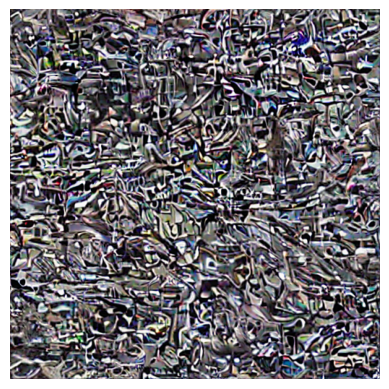

In [22]:
#FOR ALL CROSS OR SELF-ATTENTIONS:
envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn1')) 

#FOR BLOCKS:
#envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2')) #and envoy._module_path not in [my_cross_layers[idx] for idx in [np.concatenate[down_3, mid]]])

#ABLTATION
intervention1 = AblationIntervention(envoys)

#ENCODER INTERVENTION
# blank_embeds = encode_prompt("", model)
# intervention2 = EncoderIntervention(blank_embeds, envoys)
    
image = run(model, prompt="dolphin baby", seed=40, interventions=[intervention1])

#plt.title("Block 1")
plt.axis('off')
plt.imshow(image)

<span style="color: #FF4FA7; font-family: Times New Roman; font-size: 2em;">Layer Rows</span>

Applying intervention to different layers

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

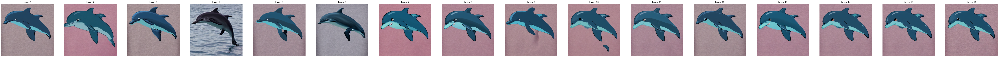

In [9]:
plt.figure(figsize=(100,20))
for m in range(16):

    #envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2') and envoy._module_path not in my_cross_layers[m])

    #envoys1 = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn1') and envoy._module_path in my_self_layers[m])
    envoys2 = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2') and envoy._module_path in my_cross_layers[m])

    #intervention1 = AblationIntervention(envoys1)
    intervention2 = ScalingIntervention(1.5, envoys2)
    
    # blank_embeds = encode_prompt("", model)
    # intervention2 = EncoderIntervention(blank_embeds, envoys2)
    
    image = run(model, prompt="dolphin baby", seed=40, interventions=[intervention2])
    #image.save('testblank.png')
    plt.subplot(1, 16, m+1)
    plt.title(f"Layer {m+1}")
    plt.axis('off')
    plt.imshow(image)
plt.show()

['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.49it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.45it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.43it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.42it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


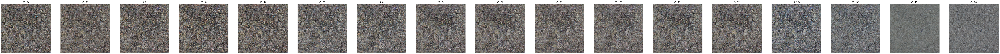

In [16]:
plt.figure(figsize=(100,100))
i=0
m=5
for n in range(17):
    print(my_cross_layers[:m])
    i += 1
    envoys = model._envoy.modules(lambda envoy : (envoy._module_path.endswith('attn1') and envoy._module_path not in my_self_layers[:m]) or (envoy._module_path.endswith('attn2') and envoy._module_path not in my_cross_layers[:n]))

    intervention1 = AblationIntervention(envoys)
    
    blank_embeds = encode_prompt("", model)
    intervention2 = EncoderIntervention(blank_embeds, envoys)
    
    image = run(model, prompt="blue elephant", seed=40, interventions=[intervention1])
    #image.save('testblank.png')
    plt.subplot(1, 17, i)
    plt.title(f"{m,n}")
    plt.axis('off')
    plt.imshow(image)
plt.show()
#plt.savefig("master.png")

<span style="color: #FF4FA7; font-family: Times New Roman; font-size: 2em;">Interactive Panel</span>

Function to apply intervention for the interactive widget

  0%|          | 0/50 [00:00<?, ?it/s]

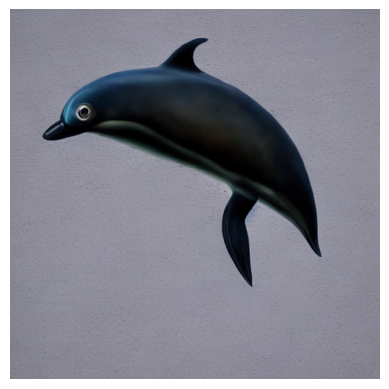

In [6]:
crossis_index =[9] 
selfis_index =[1,2,3] 

def intervene(selfis_index, crossis_index, selfis_inter, crossis_inter, prompt, seed, self_factor=None, cross_factor=None):
    self_offs = [my_self_layers[value] for element, value in enumerate (selfis_index)]
    cross_offs = [my_cross_layers[value] for element, value in enumerate (crossis_index)]

    self_envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn1') and envoy._module_path in self_offs)
    cross_envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2') and envoy._module_path in cross_offs)

    if selfis_inter == AblationIntervention:
        self_intervention = selfis_inter(self_envoys)

    elif selfis_inter == ScalingIntervention:
        self_intervention = selfis_inter(self_factor, self_envoys)

    if crossis_inter == EncoderIntervention:
        blank_embeds = encode_prompt("", model)
        cross_intervention = crossis_inter(blank_embeds, cross_envoys)
    
    elif crossis_inter == ScalingIntervention:
        cross_intervention = crossis_inter(cross_factor, cross_envoys)
    
    else:
        cross_intervention = crossis_inter(cross_envoys)

    image = run(model, prompt=prompt, seed=seed, interventions=[self_intervention, cross_intervention])

    plt.axis('off')
    plt.imshow(image)
    plt.show()

    return image

image = intervene(selfis_index, crossis_index, AblationIntervention, AblationIntervention, "dolphin baby", 40, self_factor=2, cross_factor=1)

U-Net plot of the cross attention's patch sizes

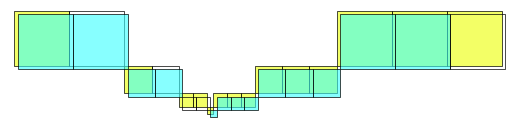

In [9]:
import matplotlib.pyplot as plt

def plot_unet(self_n, cross_n, ax=None):
    dim1 = 8
    dim2 = 16
    dim3 = 32
    dim4 = 64

    # Define the layers (same as before)

    # Create a figure and axis if not provided
    if ax is None:
        fig, ax = plt.subplots()
    # Define the layers
    layers = {
        'Layer 1': (0, dim1+dim2+dim3, dim4, dim4),  # (bottom-left corner coordinates, width, height)
        'Layer 2': (dim4, dim1+dim2+dim3, dim4, dim4),
        'Layer 3': (dim4*2, dim1+dim2, dim3, dim3),
        'Layer 4': (dim4*2+dim3, dim1+dim2, dim3, dim3),
        'Layer 5': (dim4*2+dim3*2, dim1, dim2, dim2),
        'Layer 6': (dim4*2+dim3*2+dim2, dim1, dim2, dim2),

        'Layer 7': (dim4*2+dim3*2+dim2*2, 0, dim1, dim1),
                    
        'Layer 8': (dim4*2+dim3*2+dim2*2+dim1, dim1, dim2, dim2),
        'Layer 9': (dim4*2+dim3*2+dim2*2+dim1+dim2, dim1, dim2, dim2),
        'Layer 10': (dim4*2+dim3*2+dim2*2+dim1+dim2*2, dim1, dim2, dim2),

        'Layer 11': (dim4*2+dim3*2+dim2*2+dim1+dim2*3, dim1+dim2, dim3, dim3),
        'Layer 12': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3, dim1+dim2, dim3, dim3),
        'Layer 13': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*2, dim1+dim2, dim3, dim3),

        'Layer 14': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*3, dim1+dim2+dim3, dim4, dim4),
        'Layer 15': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*3+dim4, dim1+dim2+dim3, dim4, dim4),
        'Layer 16': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*3+dim4*2, dim1+dim2+dim3, dim4, dim4)
    }

    # self
    for index, (label, (pos_x, pos_y, width, height)) in enumerate(layers.items()):
        if index not in self_n:#self_n[index] == 1:
            color = (0.92, 1.0, 0.0, .6)
        else:
            color = (0, 0, 0, 0)
        ax.add_patch(plt.Rectangle((pos_x, pos_y), width, height, edgecolor='black', facecolor=color, linewidth=.5))

    # cross
    for index, (label, (pos_x, pos_y, width, height)) in enumerate(layers.items()):
        if index not in cross_n:#cross_n[index] == 1:
            color = (0.22, 1.0, 1.0, .6)
        else:
            color = (0, 0, 0, 0)
        ax.add_patch(plt.Rectangle((pos_x+4, pos_y-4), width, height, edgecolor='black', facecolor=color, linewidth=.5))

    # Set limits and aspect ratio
    ax.set_xlim(-5, dim1+dim2*5+dim3*5+dim4*5+1+4)
    ax.set_ylim(-5, dim1+dim2+dim3+dim4+1)
    ax.set_aspect('equal')
    ax.axis("off")

    plt.show()
    
    return fig, ax  # Always return the axis object

selfis = [1,3]
crossis = [4,5,15]

fig, ax = plot_unet(selfis, crossis)
plt.show()

Execute cell to call the interactive widget. <br>
Generate an image, then place interventions where you like. (Try to generate a unicorn and ablate the cross-attention at layer 9.)

In [12]:
import matplotlib.pyplot as plt
from ipywidgets import Checkbox, HBox, VBox, Output, Button, Layout, Text, IntText, Dropdown, FloatText
from IPython.display import display, HTML
from functools import partial

def create_intervention_widget():

    self_checkboxes = [Checkbox(description=str(i+1)) for i in range(16)]
    self_row = HBox(self_checkboxes)

    cross_checkboxes = [Checkbox(description=str(i+1)) for i in range(16)]
    cross_row = HBox(cross_checkboxes)

    selfis_inter_dropdown = Dropdown(options = [AblationIntervention, ScalingIntervention], description='Self-attn intervention:')
    crossis_inter_dropdown = Dropdown(options = [AblationIntervention, EncoderIntervention, ScalingIntervention], description='Cross-attn intervention:')

    prompt_in = Text(description='Prompt:')
    seed_in = IntText(description='Seed:')
    
    self_factor_in = FloatText()
    cross_factor_in = FloatText()

    # self_output = Output()
    # cross_output = Output()
    output = Output()

    def on_run_button_click(button):
        input_selfis = [i for i, checkbox in enumerate(self_checkboxes) if checkbox.value]

        input_crossis = [i for i, checkbox in enumerate(cross_checkboxes) if checkbox.value]

        input_selfis_inter = selfis_inter_dropdown.value
        input_crossis_inter = crossis_inter_dropdown.value

        input_prompt = prompt_in.value
        input_seed = seed_in.value
        
        input_self_factor = self_factor_in.value
        input_cross_factor = cross_factor_in.value

        with output:
            output.clear_output()
            plot_unet(input_selfis, input_crossis)
            plt.show()
            intervene(input_selfis, input_crossis, input_selfis_inter, input_crossis_inter, input_prompt, input_seed, self_factor = input_self_factor, cross_factor = input_cross_factor)

    run_button = Button(description="generate image")
    run_button.on_click(on_run_button_click)

    display(VBox([prompt_in, seed_in, selfis_inter_dropdown, self_factor_in, self_row, crossis_inter_dropdown, cross_factor_in, cross_row, run_button, output]))

# Call the function to create the interactive widget
create_intervention_widget()
